In [1]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import numpy as np
import matplotlib
import hanlp
from pypinyin import lazy_pinyin, Style
from collections import defaultdict

word2vec = hanlp.load(hanlp.pretrained.word2vec.RADICAL_CHAR_EMBEDDING_100)

In [2]:
charfile='data/pretrained/words.txt'
homophone_groups = defaultdict(list)
with open(charfile, 'r', encoding="utf-8") as file:
    lines = file.readlines()
    chars = [line[0] for line in lines]
    
for char in chars:
    pinyin = lazy_pinyin(char, style=Style.TONE3) # take tone into account
    homophone_groups["".join(pinyin)].append(char)

print(homophone_groups)


defaultdict(<class 'list'>, {'de': ['的'], 'shi4': ['是', '事', '市', '式', '视', '室', '试', '世', '士', '势', '似', '氏', '饰', '释', '适', '示', '誓', '谥', '逝', '嗜', '侍', '仕', '舐', '弑', '噬', '恃', '柿', '螫', '铈', '拭', '奭', '亊', '轼', '昰', '筮', '豉', '栻', '媞', '礻', '煶', '釈', '贳', '烒', '睗', '澨', '卋'], 'zai4': ['在', '再', '载', '縡'], 'le': ['了', '饹'], 'wo3': ['我'], 'he2': ['和', '合', '河', '何', '核', '荷', '盒', '禾', '颌', '阖', '劾', '郃', '菏', '阂', '蚵', '曷', '鞨', '涸', '盍', '翮', '龁', '鹖', '狢', '饸', '詥', '鉌', '訸', '籺'], 'you3': ['有', '友', '酉', '卣', '铕', '莠', '牖', '黝', '羑', '槱', '栯', '懮', '牗'], 'bu4': ['不', '部', '布', '佈', '步', '簿', '钚', '埠', '歩', '埗', '怖', '瓿', '咘', '吥', '餔', '篰', '廍', '抪'], 'ren2': ['人', '仁', '壬', '亻', '忎'], 'ye3': ['也', '野', '冶', '吔'], 'ni3': ['你', '拟', '旎', '儗', '儞', '苨'], 'wei4': ['为', '位', '未', '喂', '味', '卫', '谓', '胃', '魏', '畏', '慰', '渭', '蔚', '尉', '猬', '鳚', '霨', '苿', '煟', '蜼'], 'ta1': ['他', '她', '它', '塌', '祂', '铊', '趿', '榙'], 'zhe4': ['这', '浙', '柘', '蔗', '鹧'], 'zhong1': ['中', '钟', '终', '忠', '锺', 

In [3]:
group_embeddings = []
    
for chars in homophone_groups.values():
    group = {}
    if len(chars) > 8:
        for char in chars:
            embedding_tensor = word2vec(char)
            # Convert PyTorch tensor to NumPy array
            embedding_array = embedding_tensor.detach().numpy()
            group[char] = embedding_array
        
        group_embeddings.append(group)
group_embeddings 

[{'是': array([ 7.54193589e-02, -2.02092052e-01, -7.77933141e-03,  3.52351591e-02,
         -8.17584023e-02,  7.62785673e-02, -7.12442445e-03, -5.06760776e-02,
          7.52984285e-02, -3.39495298e-03, -2.08615676e-01, -1.16922274e-01,
          1.32375294e-02, -1.41387433e-01, -3.02065648e-02,  2.84582376e-02,
          2.49577612e-01,  8.68754610e-02,  9.12924185e-02, -2.05783457e-01,
          1.71943405e-03,  1.41024649e-01,  1.65101571e-03, -1.67672828e-01,
         -5.82052879e-02,  1.17679656e-01,  8.02372769e-02,  7.99445137e-02,
         -9.50793028e-02, -3.11045982e-02,  1.67647377e-02,  8.35977420e-02,
         -1.06172636e-01, -8.95294622e-02,  2.09519416e-02, -6.25827909e-03,
         -3.67537290e-02,  2.18767044e-03,  6.69545680e-02,  1.46058977e-01,
         -8.03518444e-02,  1.23694114e-01, -1.07903779e-01,  4.88736555e-02,
         -1.83813214e-01, -2.14986548e-01, -7.63676688e-02, -6.37850463e-02,
         -1.93748191e-01,  3.10944151e-02, -1.11875229e-01,  1.05816223

In [4]:
 with open(charfile, 'r', encoding="utf-8") as file:
        lines = file.readlines()
        freq_list = [line[0] for line in lines]


In [5]:
import matplotlib.font_manager as fm
font_path = "./font/STHeiti-TC-Medium/STHeiti-TC-Medium.ttf"
my_font = fm.FontProperties(fname=font_path)

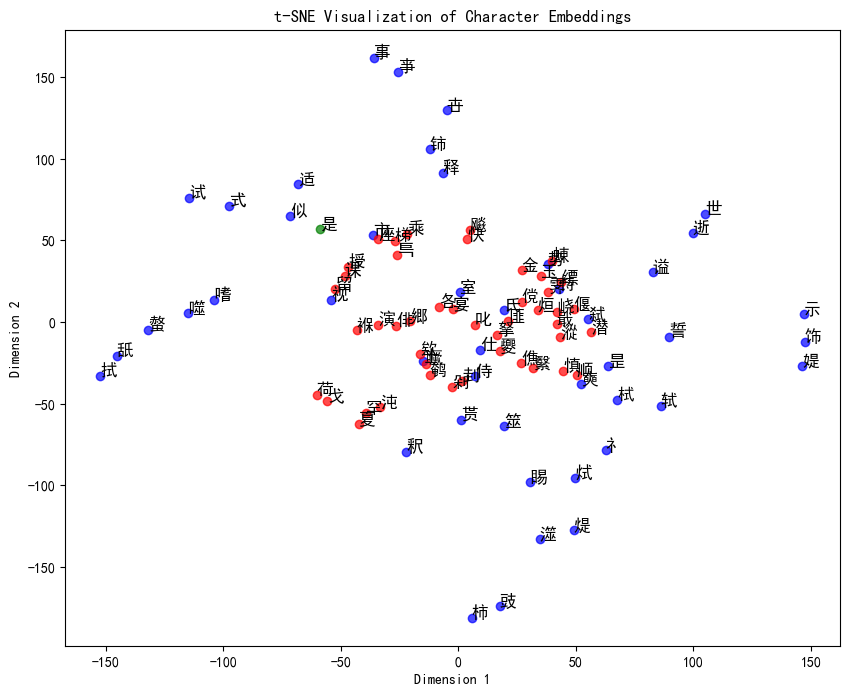

In [9]:
for x in range(1):
        homophone_chars = list(group_embeddings[x].keys())
        homophone_embeddings = list(group_embeddings[x].values())
        baseline_chars = []
        baseline_embeddings = []
        for i in range(1, len(homophone_chars)):
                for j in range(1, 100):
                        h2_index = freq_list.index(homophone_chars[i])
                        if h2_index + j < len(freq_list) and freq_list[h2_index + j] not in homophone_chars:
                                similar_frequency_char = freq_list[h2_index + j]
                                break
                        elif h2_index - j >= 0 and freq_list[h2_index - j] not in homophone_chars:
                                similar_frequency_char = freq_list[h2_index - j]
                                break
                baseline_chars.append(similar_frequency_char)
                baseline_embeddings.append(word2vec(similar_frequency_char).detach().numpy()) 
        tsne = TSNE(n_components=2, random_state=42, perplexity=5)
        homophone_embeddings_2d = tsne.fit_transform(np.array(homophone_embeddings))
        baseline_embeddings_2d = tsne.fit_transform(np.array(baseline_embeddings)) 
        font_path = "./font/STHeiti-TC-Medium/STHeiti-TC-Medium.ttf"
        my_font = fm.FontProperties(fname=font_path)
        plt.rcParams['font.sans-serif']=['SimHei']
        plt.rcParams['axes.unicode_minus']=False
        plt.figure(figsize=(10, 8))
        plt.scatter(homophone_embeddings_2d[:, 0][1:], homophone_embeddings_2d[:, 1][1:], alpha=0.7, color='blue')
        plt.scatter(baseline_embeddings_2d[:, 0], baseline_embeddings_2d[:, 1], alpha=0.7, color='red')
        plt.scatter(homophone_embeddings_2d[:, 0][0], homophone_embeddings_2d[:, 1][0], alpha=0.7, color='green')

        # Annotate points with characters
        for i, char in enumerate(homophone_chars):
            plt.annotate(char, (homophone_embeddings_2d[i, 0], homophone_embeddings_2d[i, 1]), fontsize=12)

        for i, char in enumerate(baseline_chars):
            plt.annotate(char, (baseline_embeddings_2d[i, 0], baseline_embeddings_2d[i, 1]), fontsize=12)

        plt.title('t-SNE Visualization of Character Embeddings')
        plt.xlabel('Dimension 1')
        plt.ylabel('Dimension 2')
        plt.savefig(f'plots/UMAP Visualization {str(x + 1)}.png')             

In [7]:
!pip3 install hanlp --user